In [68]:
import os
import numpy as np
np.set_printoptions(suppress=True)
import pandas as pd
import zarr
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import PIL
import imageio
import shapely
from typing import List, Tuple, Union
from shapely.geometry import LineString, MultiLineString, Polygon, Point

# load the configuration file
from l5kit.configs import load_config_data
from l5kit.configs.config import load_metadata
# load the dataset from zarr
from l5kit.data import ChunkedDataset, LocalDataManager
# load the Ego/Agent-based dataset
from l5kit.dataset import EgoDataset, AgentDataset, IntersectionDataset
# define the road_network protobuf data structure
from l5kit.data.proto.road_network_pb2 import RoadNetworkNode, RoadNetworkSegment
# Semantic map api
from l5kit.data.map_api import MapAPI
# rasterizer
from l5kit.rasterization import build_rasterizer
# geometry
from l5kit.geometry import transform_points, transform_point
# trajectory
from l5kit.visualization import draw_trajectory, TARGET_POINTS_COLOR
# get Agents info
from l5kit.sampling.agent_sampling import get_agent_context

from extract_trajectory import *

In [89]:
#@title Download L5 Sample Dataset and install L5Kit
import os
RunningInCOLAB = 'google.colab' in str(get_ipython())
if RunningInCOLAB:
    !wget https://raw.githubusercontent.com/lyft/l5kit/master/examples/setup_notebook_colab.sh -q
    !sh ./setup_notebook_colab.sh
    os.environ["L5KIT_DATA_FOLDER"] = open("./dataset_dir.txt", "r").read().strip()
else:
    os.environ["L5KIT_DATA_FOLDER"] = "./"
    # print("Not running in Google Colab.")

cfg = load_config_data("./visualisation_config_train1.yaml")
print(cfg)
dm = LocalDataManager()
dataset_path = dm.require(cfg["val_data_loader"]["key"])
# print(dataset_path)
zarr_dataset = ChunkedDataset(dataset_path)
zarr_dataset.open()

rast = build_rasterizer(cfg, dm)
dataset = EgoDataset(cfg, zarr_dataset, rast)

{'format_version': 4, 'model_params': {'model_architecture': 'resnet50', 'history_num_frames': 0, 'future_num_frames': 50, 'step_time': 0.1, 'render_ego_history': True}, 'raster_params': {'raster_size': [224, 224], 'pixel_size': [0.5, 0.5], 'ego_center': [0.25, 0.5], 'map_type': 'py_semantic', 'satellite_map_key': 'aerial_map/aerial_map.png', 'semantic_map_key': 'semantic_map/semantic_map.pb', 'dataset_meta_key': 'meta.json', 'filter_agents_threshold': 0.5, 'disable_traffic_light_faces': False, 'set_origin_to_bottom': True}, 'val_data_loader': {'key': 'scenes-train/train.zarr', 'batch_size': 12, 'shuffle': False, 'num_workers': 16}}


In [3]:
# rotate matrix
rotate_matrix = get_rotate_matrix(theta=56.5)
rotate_matrix

array([[ 0.55193699,  0.83388582],
       [-0.83388582,  0.55193699]])

In [4]:
scene_ego_trajectory = get_scene_ego_trajectory(dataset, scene_index=7)
rotate_scene_ego_trajectory = transform_scene_ego_trajectory(scene_ego_trajectory, rotate_matrix)
rotate_scene_ego_trajectory.shape

(249, 2)

In [5]:
scene_agent_trajectories = get_scene_agent_trajectories(dataset, scene_index=7, scene_filter_threshold=90)
rotate_scene_agent_trajectories = transform_scene_agent_trajectories(scene_agent_trajectories, rotate_matrix)

In [6]:
rotate_scene_agent_trajectories = filter_scene_agent_trajectory(rotate_scene_agent_trajectories)

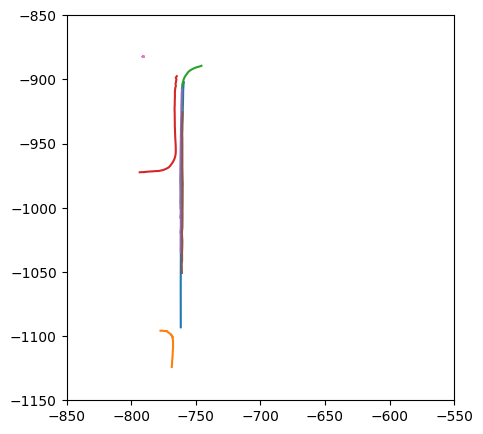

In [7]:
plot_scene_trajectories(rotate_scene_ego_trajectory, rotate_scene_agent_trajectories)

In [3]:
scene_indices = [7, 8, 42, 43, 76, 77, 56, 57, 91, 92, 93]
# scene_indices = [7, 8, 42, 43, 76, 77, 56, 57, 92, 93]
extract_intersection_scenarios(scene_indices)

[(7, 8), (42, 43), (56, 57), (76, 77), (91, 92, 93)]

In [93]:
with open("./train1_scenes_including_intersection.pkl", 'rb') as file:
    set_scenes_including_intersection = pickle.load(file)

list_scenes_including_intersection = list(set_scenes_including_intersection)

with open("./train1_frames_including_intersection.pkl", 'rb') as file:
    set_frames_including_intersection = pickle.load(file)

set_scenes_including_intersection = list(set_scenes_including_intersection)
set_scenes_including_intersection.sort()
process = extract_intersection_scenarios(set_scenes_including_intersection)
process2 = []
for i in process:
    if len(i) == 2:
        process2.append(i)

process2.__len__()

527

In [102]:
LEFT_TOP = (-850, -875)
LEFT_BOTTOM = (-850, -925)
RIGHT_TOP = (-700, -875)
RIGHT_BOTTOM = (-700, -925)

intersection_coords = (LEFT_TOP, LEFT_BOTTOM, RIGHT_BOTTOM, RIGHT_TOP, LEFT_TOP)
intersection_area = Polygon(intersection_coords)
intersection_area

for pair_idx, pair in enumerate(process2):

    if pair_idx % 20 == 0:
        print("-----", pair_idx)
    
    process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, pair)
    ego_trajectory_lineString = LineString(process_ego_trajectory)
    ego_trajectory_lineString = ego_trajectory_lineString.intersection(intersection_area)
    ego_trajectory_lineString = multiline_to_single_line(ego_trajectory_lineString)
    
    process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
    agent_trajectories = {}
    
    for key in process_agent_trajectories.keys():
        if process_agent_trajectories[key]["lineString"].intersects(intersection_area):
            process_agent_trajectories[key]["lineString"] = multiline_to_single_line(
                process_agent_trajectories[key]["lineString"].intersection(intersection_area))
            agent_trajectories[key] = process_agent_trajectories[key]
    
    for idx in agent_trajectories.keys():
        agent_trajectories[idx]["lineString"]
        traj = np.array(agent_trajectories[idx]["lineString"].coords)
        delta_x = traj[0][0] - traj[-1][0]
        delta_y = traj[0][1] - traj[-1][1]
        if delta_x < -15 and np.abs(delta_y) < 3:
            print(pair, "HV-straight-forward")
  
    
# ego_trajectory = np.array(ego_trajectory_lineString.coords)
# if ego_trajectory[0][0] < ego_trajectory[-1][0] and ego_trajectory[0][1] < ego_trajectory[-1][1]:
#     print("turn-right")
# elif ego_trajectory[0][0] > ego_trajectory[-1][0] and ego_trajectory[0][1] > ego_trajectory[-1][1]:
#     print("turn-left")
# plot_scene_trajectories(np.array(ego_trajectory_lineString.coords), agent_trajectories)

0
(42, 43) HV-straight-forward
(92, 93) HV-straight-forward
(482, 483) HV-straight-forward
20
(751, 752) HV-straight-forward
(819, 820) HV-straight-forward
(819, 820) HV-straight-forward
40
(1312, 1313) HV-straight-forward
(1579, 1580) HV-straight-forward
(1752, 1753) HV-straight-forward
60
(2199, 2200) HV-straight-forward
(2496, 2497) HV-straight-forward
80
(2572, 2573) HV-straight-forward
(2572, 2573) HV-straight-forward
(2784, 2785) HV-straight-forward
(2845, 2846) HV-straight-forward
(2888, 2889) HV-straight-forward
(2888, 2889) HV-straight-forward
(2941, 2942) HV-straight-forward
(3020, 3021) HV-straight-forward
(3122, 3123) HV-straight-forward
100
(3250, 3251) HV-straight-forward
(3250, 3251) HV-straight-forward
(3250, 3251) HV-straight-forward
(3265, 3266) HV-straight-forward
(3424, 3425) HV-straight-forward
(3424, 3425) HV-straight-forward
(3706, 3707) HV-straight-forward
(3706, 3707) HV-straight-forward
120
(3823, 3824) HV-straight-forward
(3863, 3864) HV-straight-forward
(400

## Validate

In [14]:
import pickle

with open("./validate_scenes_including_intersection.pkl", 'rb') as file:
    set_scenes_including_intersection = pickle.load(file)

list_scenes_including_intersection = list(set_scenes_including_intersection)

with open("./validate_frames_including_intersection.pkl", 'rb') as file:
    set_frames_including_intersection = pickle.load(file)

list_frames_including_intersection = list(set_frames_including_intersection)

0


C:\Users\Gavin\AppData\Local\Temp\ipykernel_18332\3540795043.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))


25
50
75
100
125
150
175
200
225
250


KeyError: 860

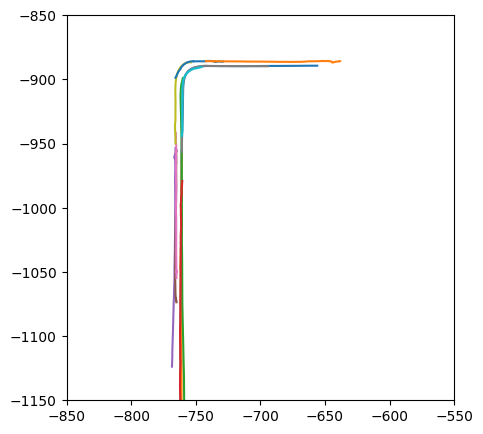

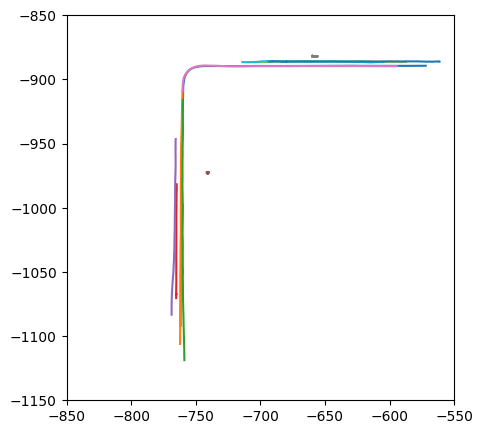

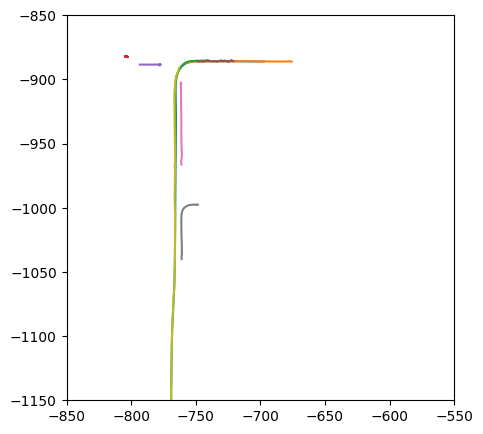

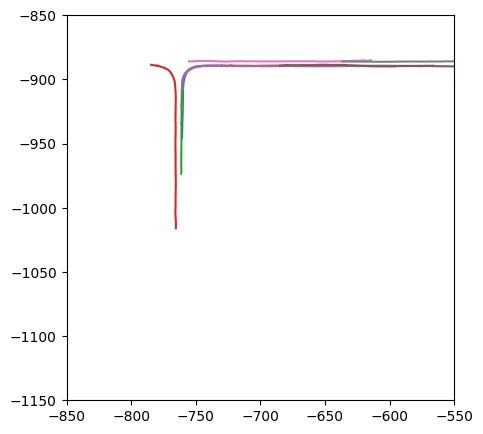

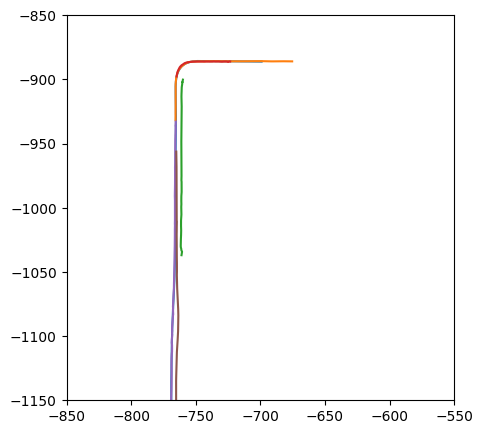

...

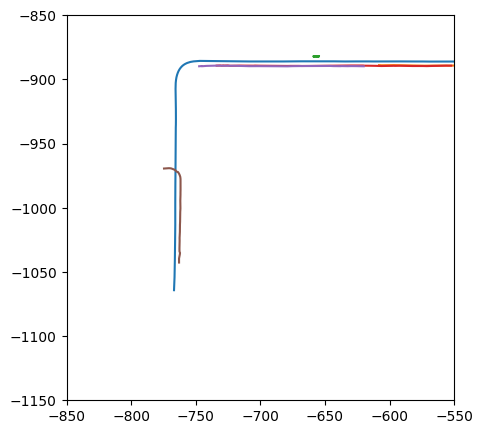

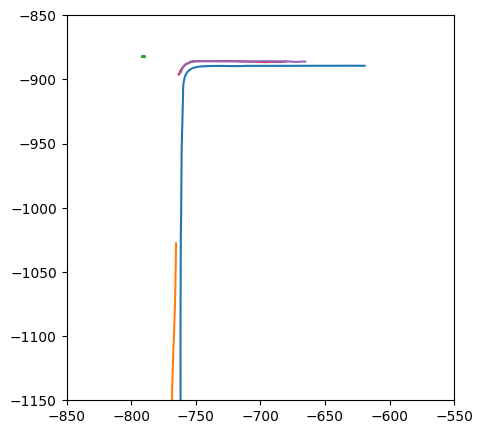

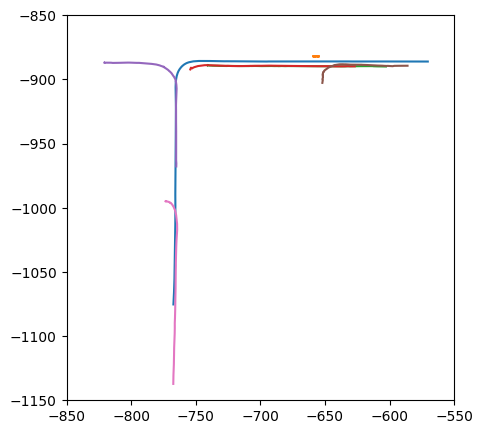

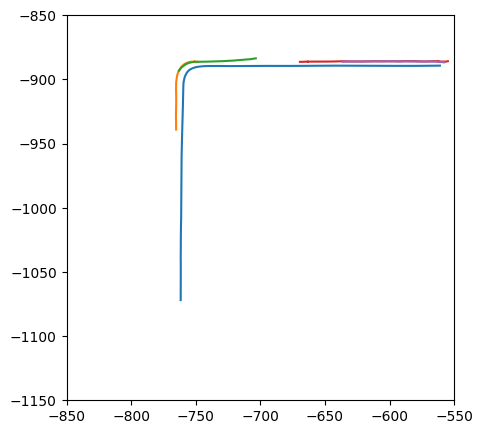

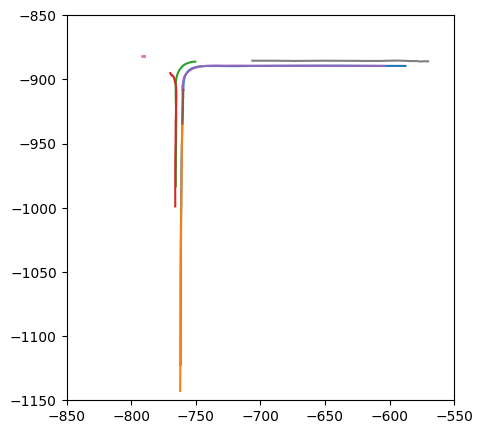

In [15]:
set_scenes_including_intersection = list(set_scenes_including_intersection)
set_scenes_including_intersection.sort()
process = extract_intersection_scenarios(set_scenes_including_intersection)
process2 = []
for i in process:
    if len(i) == 2:
        process2.append(i)

for idx, i in enumerate(process2):
    if idx % 25 == 0:
        print(idx)
    process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, i)
    process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
    # plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
    # plot_scene_ego_trajectory(process_ego_trajectory)
    # plt.show()
    plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
    plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)
    plt.savefig(f"scene_traj/validate_{i}.png", dpi=300)

## Train 2

In [17]:
with open("./train2_scenes_including_intersection.pkl", 'rb') as file:
    set_scenes_including_intersection = pickle.load(file)

list_scenes_including_intersection = list(set_scenes_including_intersection)

with open("./train2_frames_including_intersection.pkl", 'rb') as file:
    set_frames_including_intersection = pickle.load(file)

In [ ]:
set_scenes_including_intersection = list(set_scenes_including_intersection)
set_scenes_including_intersection.sort()
process = extract_intersection_scenarios(set_scenes_including_intersection)
process2 = []
for i in process:
    if len(i) == 2:
        process2.append(i)

print(process2.__len__())

for idx, i in enumerate(process2):
    if idx % 25 == 0:
        print(idx)
    process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, i)
    process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
    # plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
    # plot_scene_ego_trajectory(process_ego_trajectory)
    # plt.show()
    plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
    plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)
    plt.savefig(f"scene_traj/train2_{i}.png", dpi=300)

4451
0


C:\Users\Gavin\AppData\Local\Temp\ipykernel_18332\3768467751.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))


25
50
75
100
125
150
175
200
225
250
275
300
325
350
375
400
425
450
475
500
525
550
575
600
625
650
675
700
725
750
775
800
825
850
875
900
925
950
975
1000
1025
1050
1075
1100
1125
1150
1175
1200
1225
1250
1275
1300
1325
1350
1375
1400
1425
1450
1475
1500
1525
1550
1575
1600
1625
1650
1675
1700
1725
1750
1775
1800
1825
1850
1875
1900
1925
1950
1975
2000
2025
2050
2075
2100
2125
2150
2175
2200
2225
2250
2275
2300
2325
2350
2375
2400
2425
2450
2475
2500
2525
2550
2575
2600
2625
2650
2675
2700
2725
2750
2775
2800
2825
2850
2875
2900
2925
2950
2975
3000
3025
3050
3075
3100
3125
3150
3175
3200
3225
3250
3275
3300
3325
3350
3375
3400
3425
3450
3475
3500
3525
3550
3575
3600


## Train 1

0


C:\Users\Gavin\AppData\Local\Temp\ipykernel_18332\3737441887.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))


25
50
75
100
125
150
175
200
225
250
275
300
325
350
375
400
425
450
475
500
525


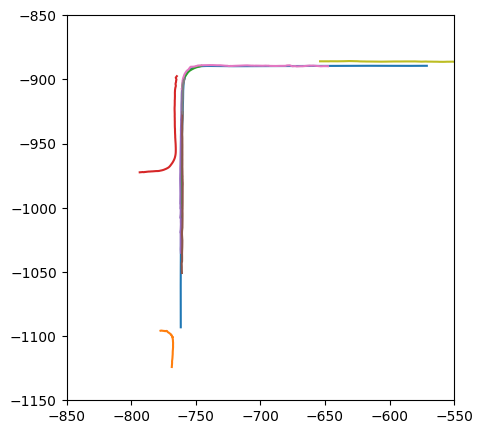

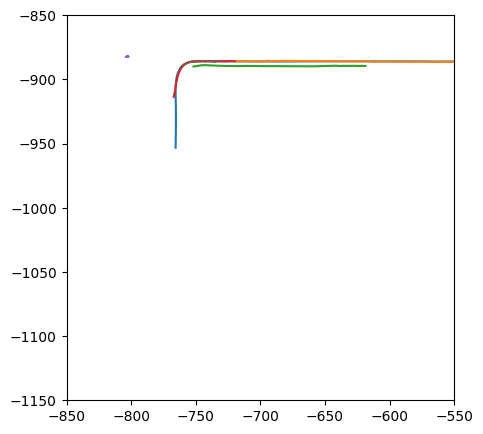

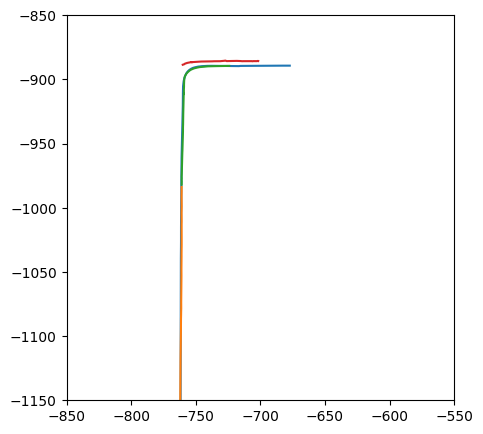

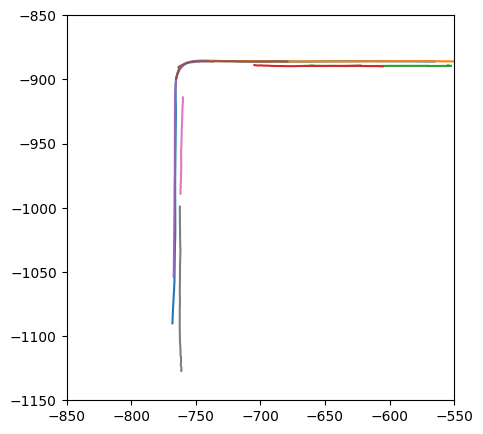

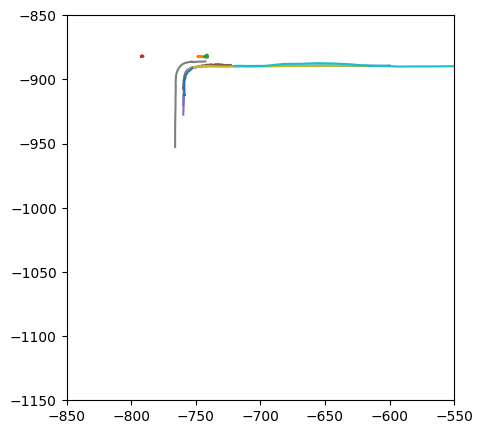

...

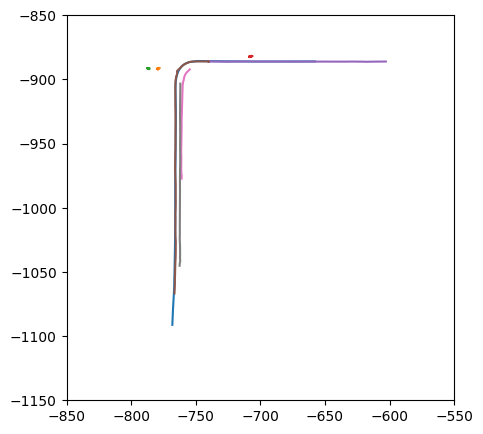

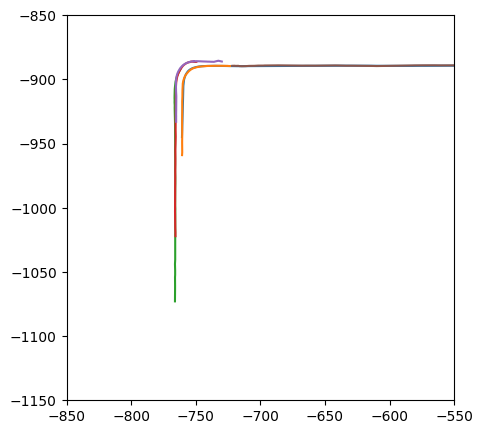

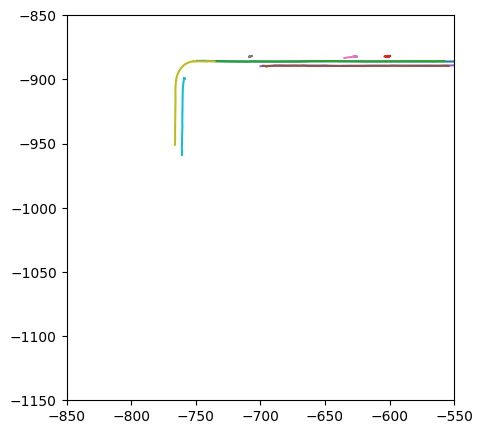

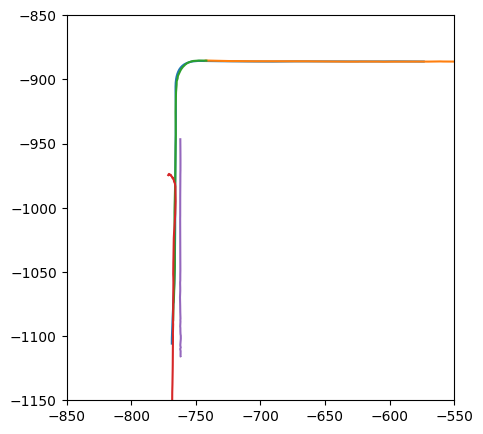

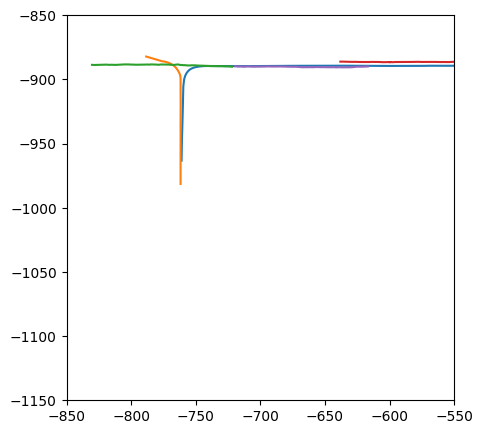

In [11]:


# for idx, i in enumerate(process2):
#     if idx % 25 == 0:
#         print(idx)
#     process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, i)
#     process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
#     # plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
#     # plot_scene_ego_trajectory(process_ego_trajectory)
#     # plt.show()
#     plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
#     plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)
#     plt.savefig(f"scene_traj/train1_{i}.png", dpi=300)

## Examples

11
8


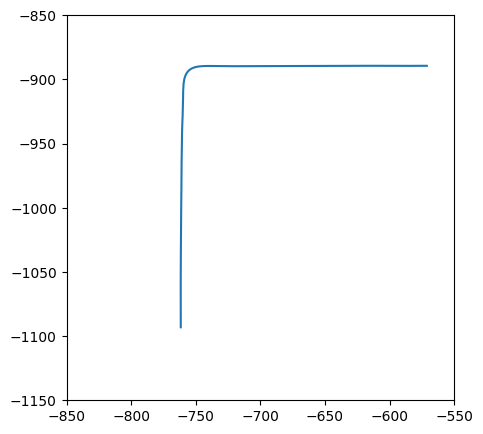

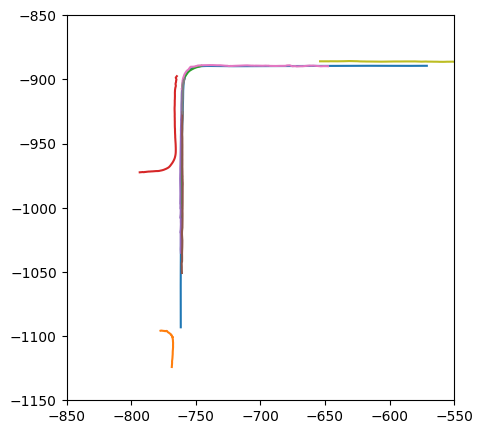

In [25]:
process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, (7,8))
print(len(process_agent_trajectories))
process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
print(len(process_agent_trajectories))
plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
plot_scene_ego_trajectory(process_ego_trajectory)
plt.show()
plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)

13
5


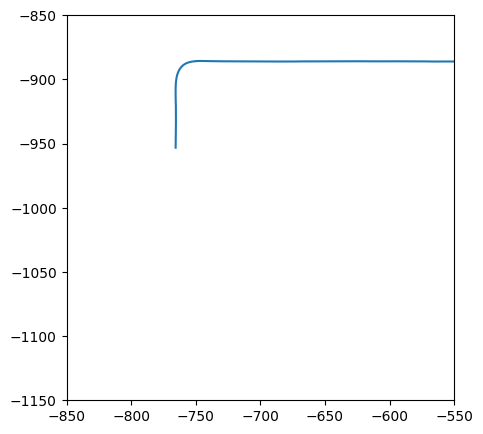

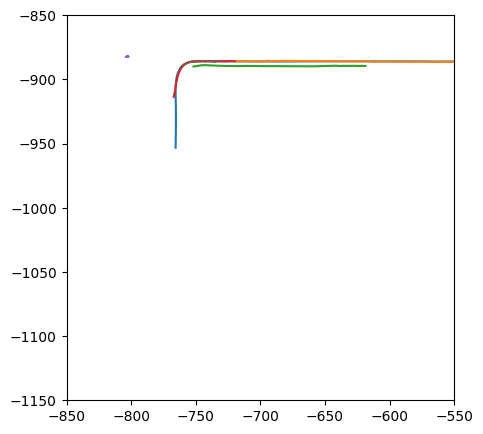

In [24]:
process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, (42, 43))
print(len(process_agent_trajectories))
process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
print(len(process_agent_trajectories))
plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
plot_scene_ego_trajectory(process_ego_trajectory)
plt.show()
plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)

12
3


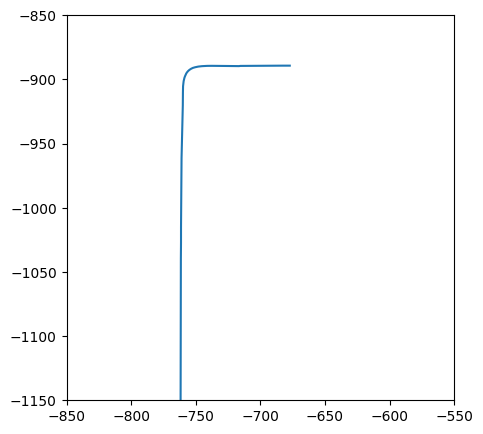

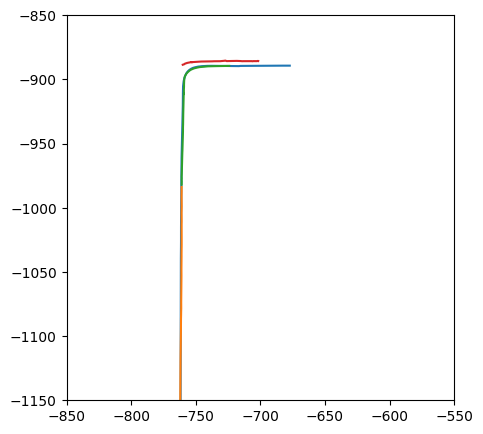

In [22]:
process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, (56, 57))
print(len(process_agent_trajectories))
process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
print(len(process_agent_trajectories))
plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
plot_scene_ego_trajectory(process_ego_trajectory)
plt.show()
plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)

18
7 dict_keys([3, 6, 10, 12, 15, 16, 17])


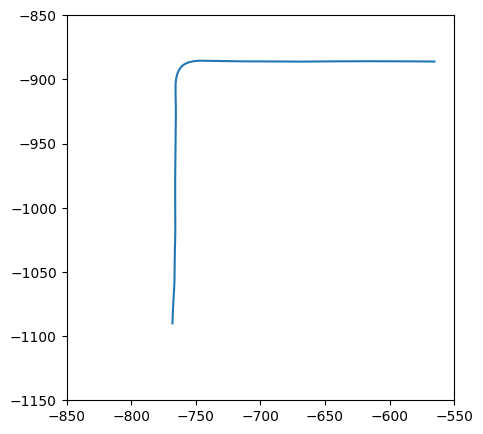

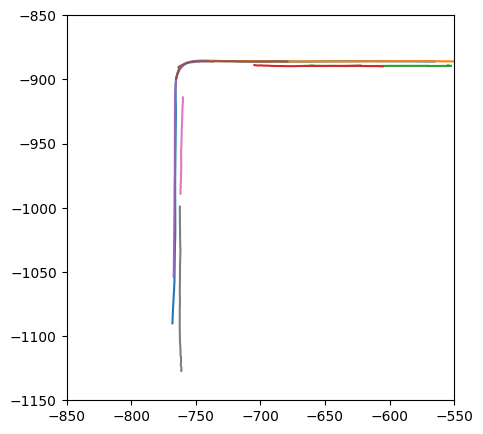

In [23]:
process_ego_trajectory, process_agent_trajectories = get_process_trajectories(dataset, (76, 77))
print(len(process_agent_trajectories))
process_agent_trajectories = filter_scene_agent_trajectory(process_agent_trajectories, length_filter_threshold=20)
print(len(process_agent_trajectories), process_agent_trajectories.keys())
plt.figure(figsize=(X_FIGURE_SIZE, Y_FIGURE_SIZE))
plot_scene_ego_trajectory(process_ego_trajectory)
plt.show()
plot_scene_trajectories(scene_ego_trajectory=process_ego_trajectory, scene_agent_trajectories=process_agent_trajectories)